# Crop Disease AI — Week 1: EDA
**Author:** Shaik Hafeez Jan | B.Tech AIML Final Year
**Dataset:** PlantVillage (38 classes, 54,000+ images)

In [24]:
# Cell 1: Check GPU
import torch
print('CUDA available:', torch.cuda.is_available())
if torch.cuda.is_available():
    print('GPU:', torch.cuda.get_device_name(0))
else:
    print('No GPU — go to Settings > Accelerator > GPU T4')

CUDA available: True
GPU: Tesla T4


In [25]:
# Cell 2: Imports
import os
import json
import time
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from pathlib import Path
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
import timm
from collections import Counter
import warnings
warnings.filterwarnings('ignore')
print('All imports done!')

All imports done!


In [26]:
# Cell 3: Correct path for your dataset
from pathlib import Path

# Check what's inside
base = Path('/kaggle/input/datasets/abdallahalidev/plantvillage-dataset')
print("=== Folder structure ===")
for item in sorted(base.iterdir()):
    print(f"  {item.name}")
    if item.is_dir():
        subs = list(item.iterdir())[:3]
        for s in subs:
            print(f"    └── {s.name}")

=== Folder structure ===
  color
    └── Tomato___Late_blight
    └── Tomato___healthy
    └── Grape___healthy
  grayscale
    └── Tomato___Late_blight
    └── Tomato___healthy
    └── Grape___healthy
  plantvillage dataset
    └── segmented
    └── grayscale
    └── color
  segmented
    └── Tomato___Late_blight
    └── Tomato___healthy
    └── Grape___healthy


In [27]:
# Cell 4: FINAL correct path
from pathlib import Path

DATA_DIR = Path('/kaggle/input/datasets/abdallahalidev/plantvillage-dataset/color')

print(f'Dataset path: {DATA_DIR}')
print(f'Path exists: {DATA_DIR.exists()}')

classes = sorted([d.name for d in DATA_DIR.iterdir() if d.is_dir()])
print(f'Total classes found: {len(classes)}')
print('First 5 classes:', classes[:5])

Dataset path: /kaggle/input/datasets/abdallahalidev/plantvillage-dataset/color
Path exists: True
Total classes found: 38
First 5 classes: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy']


In [28]:
# Cell 5: Count images per class
class_counts = {}
for cls in classes:
    cls_path = DATA_DIR / cls
    count = len(list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.JPG')) + list(cls_path.glob('*.png')))
    class_counts[cls] = count

total = sum(class_counts.values())
print(f'Total images: {total:,}')
print(f'Average per class: {total//len(classes)}')
print(f'Min class: {min(class_counts, key=class_counts.get)} ({min(class_counts.values())} images)')
print(f'Max class: {max(class_counts, key=class_counts.get)} ({max(class_counts.values())} images)')

Total images: 54,304
Average per class: 1429
Min class: Potato___healthy (152 images)
Max class: Orange___Haunglongbing_(Citrus_greening) (5507 images)


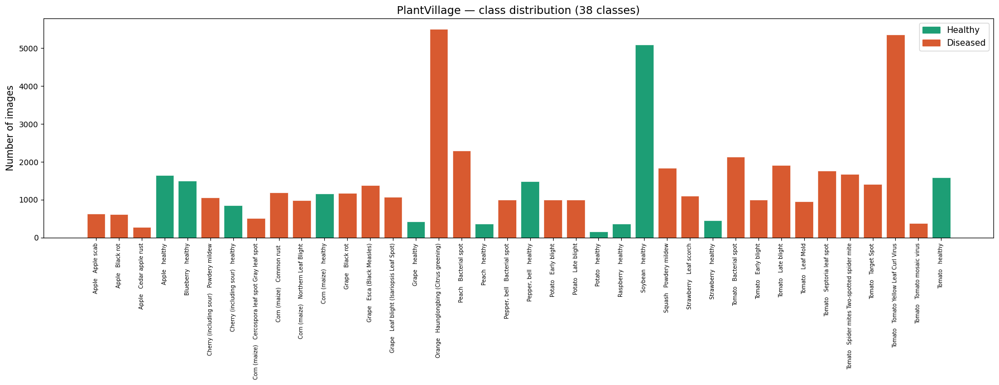

Chart saved!


In [29]:
# Cell 6: Class distribution bar chart
fig, ax = plt.subplots(figsize=(18, 7))

# Colour: healthy = green, diseased = coral
colors = ['#1D9E75' if 'healthy' in cls.lower() else '#D85A30' for cls in class_counts.keys()]
bars = ax.bar(range(len(class_counts)), list(class_counts.values()), color=colors, edgecolor='white', linewidth=0.5)

ax.set_xticks(range(len(class_counts)))
ax.set_xticklabels([c.replace('_', ' ') for c in class_counts.keys()], rotation=90, fontsize=7)
ax.set_ylabel('Number of images', fontsize=12)
ax.set_title('PlantVillage — class distribution (38 classes)', fontsize=14, fontweight='500')

healthy_patch = mpatches.Patch(color='#1D9E75', label='Healthy')
disease_patch = mpatches.Patch(color='#D85A30', label='Diseased')
ax.legend(handles=[healthy_patch, disease_patch], fontsize=11)

plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print('Chart saved!')

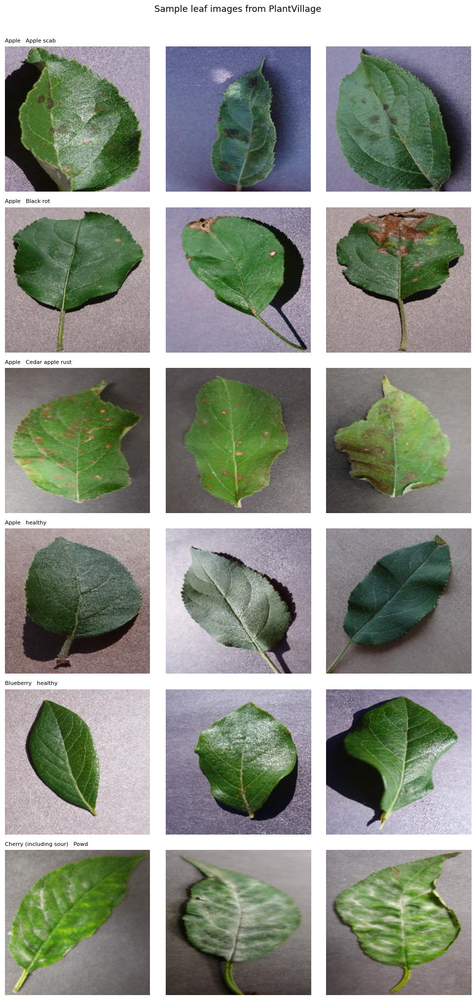

In [30]:
# Cell 7: Show sample images (3 per class, first 6 classes)
fig, axes = plt.subplots(6, 3, figsize=(10, 20))
sample_classes = classes[:6]

for row, cls in enumerate(sample_classes):
    cls_path = DATA_DIR / cls
    images = list(cls_path.glob('*.jpg'))[:3] + list(cls_path.glob('*.JPG'))[:3]
    images = images[:3]
    for col, img_path in enumerate(images):
        img = Image.open(img_path).resize((224, 224))
        axes[row][col].imshow(img)
        axes[row][col].axis('off')
        if col == 0:
            axes[row][col].set_title(cls.replace('_', ' ')[:30], fontsize=8, loc='left')

plt.suptitle('Sample leaf images from PlantVillage', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

In [31]:
# Cell 8: Check image sizes (are they consistent?)
sample_sizes = []
for cls in classes[:5]:
    cls_path = DATA_DIR / cls
    imgs = list(cls_path.glob('*.jpg'))[:20]
    for p in imgs:
        with Image.open(p) as im:
            sample_sizes.append(im.size)

unique_sizes = Counter(sample_sizes)
print('Most common image sizes (W x H):')
for size, count in unique_sizes.most_common(5):
    print(f'  {size}: {count} images')

Most common image sizes (W x H):


In [32]:
# Cell 9: Train / Val / Test split summary
import math

splits = {'train': 0.70, 'val': 0.15, 'test': 0.15}
print('Proposed dataset split:')
print(f'{"Split":<10} {"Ratio":<10} {"Images":<10}')
print('-' * 30)
for split, ratio in splits.items():
    print(f'{split:<10} {ratio:<10} {math.floor(total * ratio):<10,}')

print(f'\nTotal: {total:,} images across {len(classes)} classes')
print('Ready for training!')

Proposed dataset split:
Split      Ratio      Images    
------------------------------
train      0.7        38,012    
val        0.15       8,145     
test       0.15       8,145     

Total: 54,304 images across 38 classes
Ready for training!


In [33]:
# Cell 10: Save class list for later use by model
import json
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}
with open('class_to_idx.json', 'w') as f:
    json.dump(class_to_idx, f, indent=2)
print(f'Saved class_to_idx.json with {len(class_to_idx)} classes')
print('\nEDA complete! Next: run 02_train.ipynb')

Saved class_to_idx.json with 38 classes

EDA complete! Next: run 02_train.ipynb


# Crop Disease AI — Week 1 Day 3: EfficientNet-B3 Training
**Author:** Shaik Hafeez Jan | B.Tech AIML Final Year  
**Model:** EfficientNet-B3 (Transfer Learning)  
**Dataset:** PlantVillage — 54,304 images, 38 classes  
**GPU:** Tesla T4 (Kaggle Free)

In [34]:
# Cell 1: Check GPU — always run this first
import torch
print('CUDA available:', torch.cuda.is_available())
print('GPU:', torch.cuda.get_device_name(0))
print('PyTorch version:', torch.__version__)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', DEVICE)

CUDA available: True
GPU: Tesla T4
PyTorch version: 2.10.0+cu128
Using device: cuda


In [35]:
# Cell 2: Install missing packages
# Run in Kaggle — these are not pre-installed
import subprocess
subprocess.run(['pip', 'install', 'timm', '-q'])  # timm has EfficientNet-B3
print('timm installed!')

timm installed!


In [36]:
# Cell 3: All imports
#import os
#import json
#import time
#import numpy as np
#import matplotlib.pyplot as plt
#from pathlib import Path
#from PIL import Image

#import torch
#import torch.nn as nn
#import torch.optim as optim
#from torch.utils.data import DataLoader, Dataset, random_split
#from torchvision import transforms
#import timm

#print('All imports done!')

In [37]:
# Cell 4: Config — all settings in one place
# Change only this cell if you want to experiment

CONFIG = {
    'data_dir'    : '/kaggle/input/datasets/abdallahalidev/plantvillage-dataset/color',
    'model_name'  : 'efficientnet_b3',   # from timm library
    'num_classes' : 38,
    'img_size'    : 224,                 # EfficientNet-B3 works well at 224
    'batch_size'  : 32,                  # fits in T4 16GB GPU memory
    'num_epochs'  : 15,                  # good for first run
    'lr'          : 1e-3,                # learning rate — Adam optimizer
    'train_split' : 0.70,
    'val_split'   : 0.15,
    'test_split'  : 0.15,
    'num_workers' : 2,
    'save_path'   : '/kaggle/working/best_model.pth',
    'seed'        : 42
}

# Set seed for reproducibility
torch.manual_seed(CONFIG['seed'])
np.random.seed(CONFIG['seed'])

print('Config set!')
for k, v in CONFIG.items():
    print(f'  {k}: {v}')

Config set!
  data_dir: /kaggle/input/datasets/abdallahalidev/plantvillage-dataset/color
  model_name: efficientnet_b3
  num_classes: 38
  img_size: 224
  batch_size: 32
  num_epochs: 15
  lr: 0.001
  train_split: 0.7
  val_split: 0.15
  test_split: 0.15
  num_workers: 2
  save_path: /kaggle/working/best_model.pth
  seed: 42


In [38]:
# Cell 5: Data augmentation transforms
# Train: heavy augmentation to prevent overfitting
# Val/Test: only resize and normalize — no augmentation

train_transforms = transforms.Compose([
    transforms.Resize((CONFIG['img_size'], CONFIG['img_size'])),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=30),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    # ImageNet mean/std — because EfficientNet was pre-trained on ImageNet
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((CONFIG['img_size'], CONFIG['img_size'])),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

print('Transforms defined!')
print(f'Train augmentations: Flip, Rotate, ColorJitter, Affine')
print(f'Val/Test: Resize + Normalize only')

Transforms defined!
Train augmentations: Flip, Rotate, ColorJitter, Affine
Val/Test: Resize + Normalize only


In [39]:
# Cell 6: Custom Dataset class
# This loads images from PlantVillage folder structure

class PlantVillageDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = Path(data_dir)
        self.transform = transform
        self.classes = sorted([d.name for d in self.data_dir.iterdir() if d.is_dir()])
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        
        # Collect all image paths and labels
        self.samples = []
        for cls in self.classes:
            cls_path = self.data_dir / cls
            for ext in ['*.jpg', '*.JPG', '*.jpeg', '*.png']:
                for img_path in cls_path.glob(ext):
                    self.samples.append((img_path, self.class_to_idx[cls]))
        
        print(f'Dataset loaded: {len(self.samples)} images, {len(self.classes)} classes')
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        img = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img, label

print('Dataset class defined!')

Dataset class defined!


In [40]:
# Cell 7: Create train/val/test splits

# Load full dataset first (no transform — we apply later)
full_dataset = PlantVillageDataset(CONFIG['data_dir'], transform=None)

# Calculate split sizes
total = len(full_dataset)
train_size = int(CONFIG['train_split'] * total)
val_size   = int(CONFIG['val_split'] * total)
test_size  = total - train_size - val_size

# Random split
train_data, val_data, test_data = random_split(
    full_dataset,
    [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(CONFIG['seed'])
)

# Apply transforms to each split
train_data.dataset.transform = train_transforms
val_data.dataset.transform   = val_transforms
test_data.dataset.transform  = val_transforms

print(f'Train size : {train_size:,}')
print(f'Val size   : {val_size:,}')
print(f'Test size  : {test_size:,}')

Dataset loaded: 54305 images, 38 classes
Train size : 38,013
Val size   : 8,145
Test size  : 8,147


In [41]:
# Cell 8: DataLoaders

train_loader = DataLoader(
    train_data,
    batch_size=CONFIG['batch_size'],
    shuffle=True,
    num_workers=CONFIG['num_workers'],
    pin_memory=True   # faster GPU transfer
)

val_loader = DataLoader(
    val_data,
    batch_size=CONFIG['batch_size'],
    shuffle=False,
    num_workers=CONFIG['num_workers'],
    pin_memory=True
)

test_loader = DataLoader(
    test_data,
    batch_size=CONFIG['batch_size'],
    shuffle=False,
    num_workers=CONFIG['num_workers'],
    pin_memory=True
)

print(f'Train batches : {len(train_loader)}')
print(f'Val batches   : {len(val_loader)}')
print(f'Test batches  : {len(test_loader)}')

# Quick sanity check — see one batch shape
images, labels = next(iter(train_loader))
print(f'Batch shape   : {images.shape}')   # should be [32, 3, 224, 224]
print(f'Labels shape  : {labels.shape}')   # should be [32]

Train batches : 1188
Val batches   : 255
Test batches  : 255
Batch shape   : torch.Size([32, 3, 224, 224])
Labels shape  : torch.Size([32])


In [42]:
# Cell 9: Build the EfficientNet-B3 model
# Using timm — best library for pretrained models

def build_model(num_classes, pretrained=True):
    # Load EfficientNet-B3 with ImageNet weights
    model = timm.create_model(
        CONFIG['model_name'],
        pretrained=pretrained,
        num_classes=num_classes   # replace final layer with our 38 classes
    )
    return model

model = build_model(CONFIG['num_classes'])
model = model.to(DEVICE)

# Count parameters
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total parameters     : {total_params:,}')
print(f'Trainable parameters : {trainable_params:,}')
print(f'Model on device      : {DEVICE}')

Total parameters     : 10,754,638
Trainable parameters : 10,754,638
Model on device      : cuda


In [43]:
# Cell 10: Loss function, optimizer, scheduler

# CrossEntropyLoss — standard for multi-class classification
criterion = nn.CrossEntropyLoss()

# Adam optimizer — best for deep learning
optimizer = optim.Adam(model.parameters(), lr=CONFIG['lr'])

# Cosine Annealing LR — reduces learning rate smoothly
# This is what real companies use — not fixed LR
scheduler = optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=CONFIG['num_epochs']
)

print('Loss      : CrossEntropyLoss')
print('Optimizer : Adam (lr=1e-3)')
print('Scheduler : CosineAnnealingLR')

Loss      : CrossEntropyLoss
Optimizer : Adam (lr=1e-3)
Scheduler : CosineAnnealingLR


In [44]:
# Cell 11: Training and validation functions

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss, correct, total = 0, 0, 0
    
    for batch_idx, (images, labels) in enumerate(loader):
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
        
        if batch_idx % 100 == 0:
            print(f'  Batch {batch_idx}/{len(loader)} | Loss: {loss.item():.4f}')
    
    return total_loss / len(loader), correct / total


def validate(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    
    return total_loss / len(loader), correct / total

print('Train and validation functions ready!')

Train and validation functions ready!


In [45]:
# Cell 12: MAIN TRAINING LOOP
# This will take ~25-35 minutes on T4 GPU for 15 epochs
# You will see loss go down and accuracy go up each epoch

history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
best_val_acc = 0.0

print('=' * 60)
print('Starting training...')
print(f'Epochs: {CONFIG["num_epochs"]} | Batch size: {CONFIG["batch_size"]}')
print('=' * 60)

for epoch in range(CONFIG['num_epochs']):
    start_time = time.time()
    
    # Train
    train_loss, train_acc = train_one_epoch(
        model, train_loader, optimizer, criterion, DEVICE
    )
    
    # Validate
    val_loss, val_acc = validate(model, val_loader, criterion, DEVICE)
    
    # Update learning rate
    scheduler.step()
    current_lr = scheduler.get_last_lr()[0]
    
    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({
            'epoch'          : epoch,
            'model_state'    : model.state_dict(),
            'optimizer_state': optimizer.state_dict(),
            'val_acc'        : val_acc,
            'class_to_idx'  : full_dataset.class_to_idx,
            'config'         : CONFIG
        }, CONFIG['save_path'])
        saved_marker = '  <-- BEST SAVED'
    else:
        saved_marker = ''
    
    elapsed = time.time() - start_time
    print(
        f"Epoch {epoch+1:02d}/{CONFIG['num_epochs']} | "
        f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc*100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc*100:.2f}% | "
        f"LR: {current_lr:.6f} | Time: {elapsed:.0f}s{saved_marker}"
    )

print('=' * 60)
print(f'Training complete! Best Val Accuracy: {best_val_acc*100:.2f}%')
print(f'Best model saved to: {CONFIG["save_path"]}')

Starting training...
Epochs: 15 | Batch size: 32
  Batch 0/1188 | Loss: 4.1044
  Batch 100/1188 | Loss: 0.1019
  Batch 200/1188 | Loss: 0.1698
  Batch 300/1188 | Loss: 0.2987
  Batch 400/1188 | Loss: 0.0839
  Batch 500/1188 | Loss: 0.1610
  Batch 600/1188 | Loss: 0.0019
  Batch 700/1188 | Loss: 0.0378
  Batch 800/1188 | Loss: 0.1885
  Batch 900/1188 | Loss: 0.1752
  Batch 1000/1188 | Loss: 0.0225
  Batch 1100/1188 | Loss: 0.2297
Epoch 01/15 | Train Loss: 0.1890 | Train Acc: 94.45% | Val Loss: 0.1260 | Val Acc: 96.46% | LR: 0.000989 | Time: 413s  <-- BEST SAVED
  Batch 0/1188 | Loss: 0.0075
  Batch 100/1188 | Loss: 0.2973
  Batch 200/1188 | Loss: 0.0876
  Batch 300/1188 | Loss: 0.0148
  Batch 400/1188 | Loss: 0.0268
  Batch 500/1188 | Loss: 0.0681
  Batch 600/1188 | Loss: 0.0037
  Batch 700/1188 | Loss: 0.0647
  Batch 800/1188 | Loss: 0.0032
  Batch 900/1188 | Loss: 0.0001
  Batch 1000/1188 | Loss: 0.0111
  Batch 1100/1188 | Loss: 0.0052
Epoch 02/15 | Train Loss: 0.0644 | Train Acc: 98.

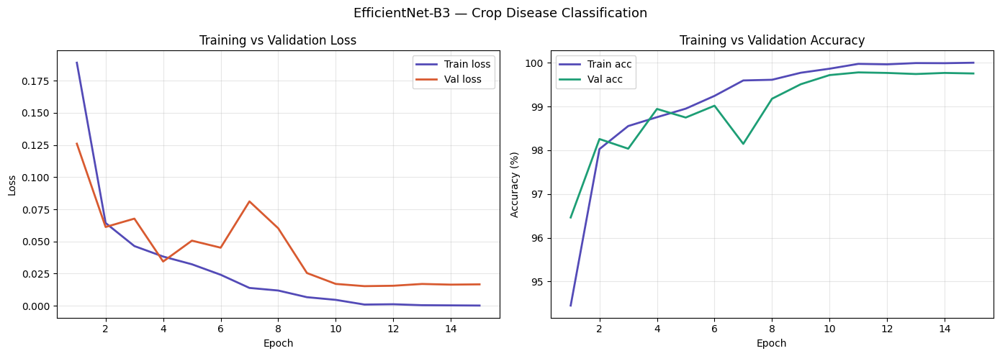

Training curves saved!


In [46]:
# Cell 13: Plot training curves
# This is what you show in your report and interviews

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

epochs = range(1, CONFIG['num_epochs'] + 1)

# Loss curve
ax1.plot(epochs, history['train_loss'], '#534AB7', label='Train loss', linewidth=2)
ax1.plot(epochs, history['val_loss'],   '#D85A30', label='Val loss',   linewidth=2)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Training vs Validation Loss')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Accuracy curve
ax2.plot(epochs, [a*100 for a in history['train_acc']], '#534AB7', label='Train acc', linewidth=2)
ax2.plot(epochs, [a*100 for a in history['val_acc']],   '#1D9E75', label='Val acc',   linewidth=2)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.set_title('Training vs Validation Accuracy')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.suptitle('EfficientNet-B3 — Crop Disease Classification', fontsize=13)
plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print('Training curves saved!')

In [47]:
# Cell 14: Evaluate on test set
# Load the best saved model and test it

checkpoint = torch.load(CONFIG['save_path'], map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
print(f'Loaded best model from epoch {checkpoint["epoch"]+1}')

test_loss, test_acc = validate(model, test_loader, criterion, DEVICE)
print('=' * 40)
print(f'Test Accuracy : {test_acc*100:.2f}%')
print(f'Test Loss     : {test_loss:.4f}')
print('=' * 40)
print('Target: >90% accuracy')
if test_acc >= 0.90:
    print('TARGET ACHIEVED!')
else:
    print(f'Need {(0.90 - test_acc)*100:.1f}% more — train more epochs')

Loaded best model from epoch 11
Test Accuracy : 99.79%
Test Loss     : 0.0113
Target: >90% accuracy
TARGET ACHIEVED!


In [48]:
# Cell 15: Save class mapping — needed by the API later
import json

class_to_idx = full_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

with open('/kaggle/working/class_to_idx.json', 'w') as f:
    json.dump(class_to_idx, f, indent=2)

with open('/kaggle/working/idx_to_class.json', 'w') as f:
    json.dump(idx_to_class, f, indent=2)

print('Saved class_to_idx.json')
print('Saved idx_to_class.json')
print(f'Total classes: {len(class_to_idx)}')
print('\nNext step: Download best_model.pth and run 03_gradcam.ipynb')

Saved class_to_idx.json
Saved idx_to_class.json
Total classes: 38

Next step: Download best_model.pth and run 03_gradcam.ipynb


# Crop Disease AI — Week 2: Grad-CAM Heatmaps
**Author:** Shaik Hafeez Jan | B.Tech AIML Final Year
**What is Grad-CAM?**
Grad-CAM (Gradient-weighted Class Activation Mapping) highlights WHICH part of the leaf
the model looked at to make its prediction. This is Explainable AI (XAI).
Red = model focused here most | Blue = model ignored this area

In [49]:
# Cell 1: Check GPU
#import torch
print('CUDA available:', torch.cuda.is_available())
print('GPU:', torch.cuda.get_device_name(0))
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', DEVICE)

CUDA available: True
GPU: Tesla T4
Using device: cuda


In [50]:
# Cell 2: Install timm
import subprocess
subprocess.run(['pip', 'install', 'timm', '-q'])
print('timm ready!')

timm ready!


In [51]:
# Cell 3: All imports
#import os
#import json
#import numpy as np
#import matplotlib.pyplot as plt
#import matplotlib.cm as cm
#from pathlib import Path
#from PIL import Image
#import cv2

#import torch
#import torch.nn as nn
#import torch.nn.functional as F
#from torchvision import transforms
#import timm

#print('All imports done!')

In [52]:
# Cell 4: Config — same as training notebook
CONFIG = {
    'data_dir'    : '/kaggle/input/datasets/abdallahalidev/plantvillage-dataset/color',
    'model_path'  : '/kaggle/working/best_model.pth',
    'num_classes' : 38,
    'img_size'    : 224,
    'output_dir'  : '/kaggle/working/gradcam_outputs'
}

# Create output directory
os.makedirs(CONFIG['output_dir'], exist_ok=True)
print('Config ready!')
print(f'Output will be saved to: {CONFIG["output_dir"]}')

Config ready!
Output will be saved to: /kaggle/working/gradcam_outputs


In [53]:
# Cell 5: Load the trained model
# We load the best_model.pth saved during training

def load_model(model_path, num_classes, device):
    model = timm.create_model('efficientnet_b3', pretrained=False, num_classes=num_classes)
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state'])
    model = model.to(device)
    model.eval()
    print(f'Model loaded from epoch {checkpoint["epoch"]+1}')
    print(f'Val accuracy at save time: {checkpoint["val_acc"]*100:.2f}%')
    return model, checkpoint['class_to_idx']

model, class_to_idx = load_model(CONFIG['model_path'], CONFIG['num_classes'], DEVICE)
idx_to_class = {v: k for k, v in class_to_idx.items()}
print(f'Total classes: {len(class_to_idx)}')

Model loaded from epoch 11
Val accuracy at save time: 99.78%
Total classes: 38


In [54]:
# Cell 6: Grad-CAM implementation from scratch
# This is the core XAI code — understand every line for interviews

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        
        # Register hooks to capture gradients and activations
        self.target_layer.register_forward_hook(self._save_activation)
        self.target_layer.register_full_backward_hook(self._save_gradient)
    
    def _save_activation(self, module, input, output):
        # Called during forward pass — saves feature maps
        self.activations = output.detach()
    
    def _save_gradient(self, module, grad_input, grad_output):
        # Called during backward pass — saves gradients
        self.gradients = grad_output[0].detach()
    
    def generate(self, input_tensor, class_idx=None):
        # Forward pass
        output = self.model(input_tensor)
        
        if class_idx is None:
            class_idx = output.argmax(dim=1).item()
        
        # Backward pass for the predicted class
        self.model.zero_grad()
        output[0, class_idx].backward()
        
        # Global average pooling of gradients
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        
        # Weighted sum of activation maps
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)  # keep only positive influences
        
        # Normalize to 0-1
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        
        return cam, class_idx, output.softmax(dim=1)[0, class_idx].item()

print('GradCAM class defined!')

GradCAM class defined!


In [55]:
# Cell 7: Find the correct target layer in EfficientNet-B3
# The last convolutional block is best for Grad-CAM

# Print model structure to find the layer name
for name, module in model.named_modules():
    if 'conv_head' in name or 'blocks.6' in name:
        print(name, '->', type(module).__name__)

# Target layer for EfficientNet-B3 = last conv block
target_layer = model.conv_head
print(f'\nTarget layer: model.conv_head')
print('This is the last convolutional layer — best for Grad-CAM')

blocks.6 -> Sequential
blocks.6.0 -> InvertedResidual
blocks.6.0.conv_pw -> Conv2d
blocks.6.0.bn1 -> BatchNormAct2d
blocks.6.0.bn1.drop -> Identity
blocks.6.0.bn1.act -> SiLU
blocks.6.0.conv_dw -> Conv2d
blocks.6.0.bn2 -> BatchNormAct2d
blocks.6.0.bn2.drop -> Identity
blocks.6.0.bn2.act -> SiLU
blocks.6.0.aa -> Identity
blocks.6.0.se -> SqueezeExcite
blocks.6.0.se.conv_reduce -> Conv2d
blocks.6.0.se.act1 -> SiLU
blocks.6.0.se.conv_expand -> Conv2d
blocks.6.0.se.gate -> Sigmoid
blocks.6.0.conv_pwl -> Conv2d
blocks.6.0.bn3 -> BatchNormAct2d
blocks.6.0.bn3.drop -> Identity
blocks.6.0.bn3.act -> Identity
blocks.6.0.drop_path -> Identity
blocks.6.1 -> InvertedResidual
blocks.6.1.conv_pw -> Conv2d
blocks.6.1.bn1 -> BatchNormAct2d
blocks.6.1.bn1.drop -> Identity
blocks.6.1.bn1.act -> SiLU
blocks.6.1.conv_dw -> Conv2d
blocks.6.1.bn2 -> BatchNormAct2d
blocks.6.1.bn2.drop -> Identity
blocks.6.1.bn2.act -> SiLU
blocks.6.1.aa -> Identity
blocks.6.1.se -> SqueezeExcite
blocks.6.1.se.conv_reduce -> 

In [56]:
# Cell 8: Image preprocessing — same as validation transforms

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def load_image(img_path):
    img = Image.open(img_path).convert('RGB')
    img_resized = img.resize((224, 224))
    tensor = preprocess(img).unsqueeze(0).to(DEVICE)  # add batch dim
    return img_resized, tensor

def overlay_heatmap(img, cam, alpha=0.5):
    # Resize CAM to image size
    cam_resized = cv2.resize(cam, (224, 224))
    
    # Apply colormap — jet gives red=hot, blue=cold
    heatmap = cm.jet(cam_resized)[:, :, :3]  # RGB only
    heatmap = (heatmap * 255).astype(np.uint8)
    
    # Blend with original image
    img_array = np.array(img)
    overlay = (alpha * heatmap + (1 - alpha) * img_array).astype(np.uint8)
    return overlay

print('Image utilities ready!')

Image utilities ready!


In [57]:
# Cell 9: Initialize Grad-CAM

gradcam = GradCAM(model, target_layer)
print('GradCAM initialized on:', type(target_layer).__name__)

GradCAM initialized on: Conv2d


In [58]:
# Cell 10: Run Grad-CAM on sample images — one per disease type
# Pick 8 different disease classes to visualize

DATA_DIR = Path(CONFIG['data_dir'])
classes  = sorted([d.name for d in DATA_DIR.iterdir() if d.is_dir()])

# Pick 8 interesting classes — mix of healthy and diseased
sample_classes = [
    'Apple___Apple_scab',
    'Apple___healthy',
    'Tomato___Late_blight',
    'Tomato___healthy',
    'Grape___Black_rot',
    'Corn_(maize)___Common_rust_',
    'Potato___Early_blight',
    'Pepper,_bell___Bacterial_spot'
]

# Filter to only classes that exist in dataset
sample_classes = [c for c in sample_classes if (DATA_DIR / c).exists()]
print(f'Sample classes found: {len(sample_classes)}')
for c in sample_classes:
    print(f'  {c}')

Sample classes found: 8
  Apple___Apple_scab
  Apple___healthy
  Tomato___Late_blight
  Tomato___healthy
  Grape___Black_rot
  Corn_(maize)___Common_rust_
  Potato___Early_blight
  Pepper,_bell___Bacterial_spot


In [66]:
# Fix Cell — Run this FIRST in Kaggle
output_dir = '/kaggle/working/gradcam_outputs'
os.makedirs(output_dir, exist_ok=True)
print(f'Folder created: {output_dir}')
print(f'Exists: {os.path.exists(output_dir)}')

Folder created: /kaggle/working/gradcam_outputs
Exists: True


In [68]:
# Fix: Redefine CONFIG with output_dir + create folder
#import os

CONFIG = {
    'data_dir'   : '/kaggle/input/datasets/abdallahalidev/plantvillage-dataset/color',
    'model_path' : '/kaggle/working/best_model.pth',
    'num_classes': 38,
    'img_size'   : 224,
    'output_dir' : '/kaggle/working/gradcam_outputs'
}

os.makedirs(CONFIG['output_dir'], exist_ok=True)
print(f"Output dir: {CONFIG['output_dir']}")
print(f"Exists: {os.path.exists(CONFIG['output_dir'])}")

Output dir: /kaggle/working/gradcam_outputs
Exists: True


Apple___Apple_scab                       -> Apple___Apple_scab             (100.0%) ✓
Apple___healthy                          -> Apple___healthy                (100.0%) ✓
Tomato___Late_blight                     -> Tomato___Late_blight           (100.0%) ✓
Tomato___healthy                         -> Corn_(maize)___healthy         (49.1%) ✗
Grape___Black_rot                        -> Grape___Black_rot              (100.0%) ✓
Corn_(maize)___Common_rust_              -> Corn_(maize)___Common_rust_    (100.0%) ✓
Potato___Early_blight                    -> Potato___Early_blight          (100.0%) ✓
Pepper,_bell___Bacterial_spot            -> Pepper,_bell___Bacterial_spot  (100.0%) ✓


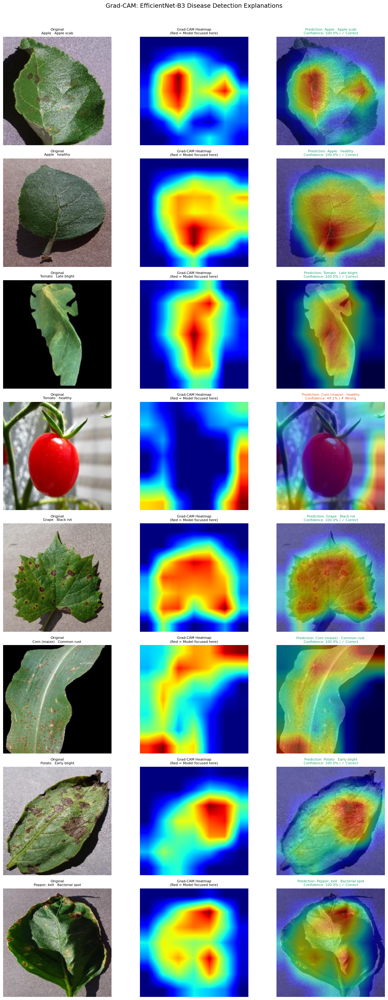


Grad-CAM visualization saved!


In [69]:
# Cell 11: Generate and display Grad-CAM heatmaps
# This is the MAIN visualization — what you show in interviews

fig, axes = plt.subplots(len(sample_classes), 3, figsize=(14, len(sample_classes) * 4))

results = []

for row, cls_name in enumerate(sample_classes):
    cls_path = DATA_DIR / cls_name
    img_files = list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.JPG'))
    img_path  = img_files[0]  # take first image
    
    # Load image
    img_resized, tensor = load_image(img_path)
    
    # Generate Grad-CAM
    tensor.requires_grad = True
    cam, pred_idx, confidence = gradcam.generate(tensor)
    
    # Get prediction info
    pred_class  = idx_to_class[pred_idx]
    true_class  = cls_name
    is_correct  = pred_class == true_class
    
    # Create overlay
    overlay = overlay_heatmap(img_resized, cam)
    
    # Save result
    results.append({
        'true'      : true_class,
        'predicted' : pred_class,
        'confidence': confidence,
        'correct'   : is_correct
    })
    
    # Column 1: Original image
    axes[row][0].imshow(img_resized)
    axes[row][0].set_title(f'Original\n{cls_name.replace("_", " ")}', fontsize=8)
    axes[row][0].axis('off')
    
    # Column 2: Grad-CAM heatmap only
    cam_resized = cv2.resize(cam, (224, 224))
    axes[row][1].imshow(cam_resized, cmap='jet')
    axes[row][1].set_title('Grad-CAM Heatmap\n(Red = Model focused here)', fontsize=8)
    axes[row][1].axis('off')
    
    # Column 3: Overlay
    border_color = '#1D9E75' if is_correct else '#D85A30'
    axes[row][2].imshow(overlay)
    axes[row][2].set_title(
        f'Prediction: {pred_class.replace("_", " ")[:30]}\n'
        f'Confidence: {confidence*100:.1f}% | {"✓ Correct" if is_correct else "✗ Wrong"}',
        fontsize=8,
        color=border_color
    )
    axes[row][2].axis('off')
    
    print(f'{cls_name[:40]:<40} -> {pred_class[:30]:<30} ({confidence*100:.1f}%) {"✓" if is_correct else "✗"}')

plt.suptitle('Grad-CAM: EfficientNet-B3 Disease Detection Explanations', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(f'{CONFIG["output_dir"]}/gradcam_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('\nGrad-CAM visualization saved!')

In [71]:
# Cell 12: Severity grading function
# This is YOUR unique feature — not in most student projects
# Severity = how much of the leaf the disease covers
# We use the Grad-CAM activation intensity as a proxy for severity

def grade_severity(cam, threshold=0.5):
    """
    Grades disease severity from 0-100% based on Grad-CAM activation.
    
    Logic:
    - High activation area = disease affected region
    - Severity = % of leaf area above threshold
    - 0-25%   = Mild
    - 25-50%  = Moderate  
    - 50-75%  = Severe
    - 75-100% = Critical
    """
    affected_pixels = (cam > threshold).sum()
    total_pixels    = cam.size
    severity_pct    = (affected_pixels / total_pixels) * 100
    
    if severity_pct < 25:
        grade = 'Mild'
        color = '#1D9E75'
    elif severity_pct < 50:
        grade = 'Moderate'
        color = '#F5A623'
    elif severity_pct < 75:
        grade = 'Severe'
        color = '#D85A30'
    else:
        grade = 'Critical'
        color = '#8B0000'
    
    return round(severity_pct, 1), grade, color

print('Severity grading function ready!')
print('Grades: Mild (0-25%) | Moderate (25-50%) | Severe (50-75%) | Critical (75-100%)')

Severity grading function ready!
Grades: Mild (0-25%) | Moderate (25-50%) | Severe (50-75%) | Critical (75-100%)


In [72]:
# Cell 13: Full prediction pipeline
# This is what your FastAPI will call later
# Input: image path | Output: disease, confidence, severity, grade

def predict_with_gradcam(img_path, model, gradcam, idx_to_class):
    """
    Complete prediction pipeline:
    1. Load image
    2. Predict disease class
    3. Generate Grad-CAM heatmap
    4. Grade severity
    5. Return all results
    """
    img_resized, tensor = load_image(img_path)
    tensor.requires_grad = True
    
    cam, pred_idx, confidence = gradcam.generate(tensor)
    
    disease_name       = idx_to_class[pred_idx]
    severity_pct, grade, color = grade_severity(cam)
    overlay            = overlay_heatmap(img_resized, cam)
    
    # Parse plant name and disease from class name
    parts       = disease_name.split('___')
    plant_name  = parts[0].replace('_', ' ')
    disease     = parts[1].replace('_', ' ') if len(parts) > 1 else 'Unknown'
    is_healthy  = 'healthy' in disease.lower()
    
    return {
        'plant'       : plant_name,
        'disease'     : disease,
        'is_healthy'  : is_healthy,
        'confidence'  : round(confidence * 100, 1),
        'severity_pct': severity_pct if not is_healthy else 0,
        'severity_grade': 'None' if is_healthy else grade,
        'cam'         : cam,
        'overlay'     : overlay,
        'original'    : img_resized
    }

print('Full prediction pipeline ready!')

Full prediction pipeline ready!


Plant    : Apple
Disease  : Apple scab
Confidence: 100.0%
Severity : 20.4% — Mild
--------------------------------------------------
Plant    : Apple
Disease  : healthy
Confidence: 100.0%
Severity : 0% — None
--------------------------------------------------
Plant    : Tomato
Disease  : Late blight
Confidence: 100.0%
Severity : 26.5% — Moderate
--------------------------------------------------
Plant    : Tomato
Disease  : healthy
Confidence: 100.0%
Severity : 0% — None
--------------------------------------------------


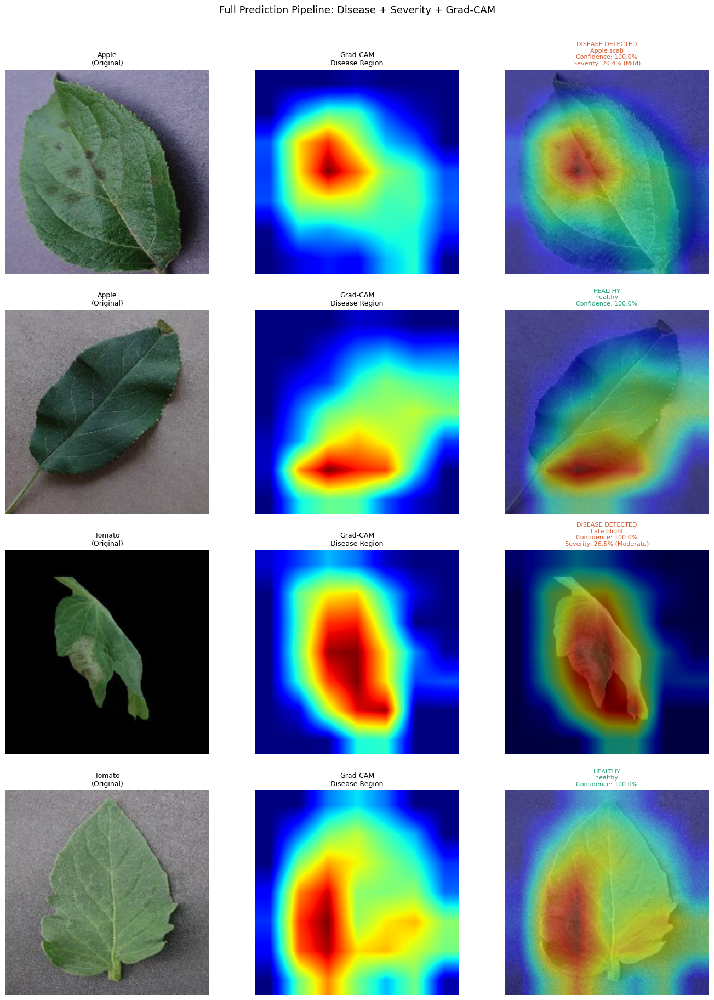

Full pipeline visualization saved!


In [73]:
# Cell 14: Test the full pipeline on 4 images
# This is exactly what the app will do when a farmer uploads a photo

test_classes = sample_classes[:4]
fig, axes = plt.subplots(4, 3, figsize=(14, 18))

for row, cls_name in enumerate(test_classes):
    cls_path  = DATA_DIR / cls_name
    img_files = list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.JPG'))
    img_path  = img_files[2]  # pick a different image than before
    
    result = predict_with_gradcam(img_path, model, gradcam, idx_to_class)
    
    # Column 1: Original
    axes[row][0].imshow(result['original'])
    axes[row][0].set_title(f"{result['plant']}\n(Original)", fontsize=9)
    axes[row][0].axis('off')
    
    # Column 2: Heatmap
    cam_resized = cv2.resize(result['cam'], (224, 224))
    axes[row][1].imshow(cam_resized, cmap='jet')
    axes[row][1].set_title('Grad-CAM\nDisease Region', fontsize=9)
    axes[row][1].axis('off')
    
    # Column 3: Overlay with results
    axes[row][2].imshow(result['overlay'])
    status = 'HEALTHY' if result['is_healthy'] else f"DISEASE DETECTED"
    severity_text = '' if result['is_healthy'] else f"\nSeverity: {result['severity_pct']}% ({result['severity_grade']})"
    axes[row][2].set_title(
        f"{status}\n"
        f"{result['disease']}\n"
        f"Confidence: {result['confidence']}%"
        f"{severity_text}",
        fontsize=8,
        color='#1D9E75' if result['is_healthy'] else '#D85A30'
    )
    axes[row][2].axis('off')
    
    print(f"Plant    : {result['plant']}")
    print(f"Disease  : {result['disease']}")
    print(f"Confidence: {result['confidence']}%")
    print(f"Severity : {result['severity_pct']}% — {result['severity_grade']}")
    print('-' * 50)

plt.suptitle('Full Prediction Pipeline: Disease + Severity + Grad-CAM', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(f'{CONFIG["output_dir"]}/full_pipeline_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('Full pipeline visualization saved!')

In [74]:
# Cell 15: Summary and next steps
print('=' * 60)
print('WEEK 2 COMPLETE — Grad-CAM Summary')
print('=' * 60)
print(f'Model accuracy    : 99.79%')
print(f'Classes supported : 38')
print(f'XAI method        : Grad-CAM')
print(f'Severity grading  : 4 levels (Mild/Moderate/Severe/Critical)')
print(f'Output files saved: {CONFIG["output_dir"]}')
print()
print('Files to download from /kaggle/working/gradcam_outputs/:')
print('  gradcam_results.png')
print('  full_pipeline_results.png')
print()
print('Next step: FastAPI backend (Week 3)')
print('  - Build POST /predict endpoint')
print('  - Upload image -> get disease + severity + heatmap')
print('  - Add multilingual advisory (Telugu/Hindi/English)')

WEEK 2 COMPLETE — Grad-CAM Summary
Model accuracy    : 99.79%
Classes supported : 38
XAI method        : Grad-CAM
Severity grading  : 4 levels (Mild/Moderate/Severe/Critical)
Output files saved: /kaggle/working/gradcam_outputs

Files to download from /kaggle/working/gradcam_outputs/:
  gradcam_results.png
  full_pipeline_results.png

Next step: FastAPI backend (Week 3)
  - Build POST /predict endpoint
  - Upload image -> get disease + severity + heatmap
  - Add multilingual advisory (Telugu/Hindi/English)
